# Google Colab Lab Assignment -YOLO 11 Model

**Course Name:** Deep Learning

**Lab Title:** Yolo11 -Model-Application Name(Custom Dataset should be Different for each group)

**Student Name:** Sanika Kundekar

**Student ID:** 202201040092

**Date of Submission:**  20/03/2025

**Group Members**:
1) Sanika Kundekar(202201040092)

2) Kiran Shinde (202201040091)

3) Yash Nair (202201040075)


**Objective**
The purpose of this lab is to understand and implement YOLOv11 for real-time object detection. Students will perform dataset preparation, model implementation, inference, and performance evaluation.




**Task 1: Environment Setup and YOLOv11 Installation**

Objective: Set up the required libraries and dependencies to run YOLOv11.

**Instructions:**

1. Install Python and required libraries (PyTorch, OpenCV, Ultralytics, etc.).
2. Install YOLOv11 from the official repository.
3. Verify the installation by running a sample script.
4. **Expected Outcome:** A functional YOLOv11 environment ready for experimentation.


In [2]:
#Dataset - https://universe.roboflow.com/microsoft/coco/dataset/34
# Code Task 1
# Install required libraries
!pip install roboflow ultralytics torch torchvision opencv-python

# Import necessary modules
from roboflow import Roboflow
import torch
import ultralytics

# Check if GPU is available
print("PyTorch GPU Available:", torch.cuda.is_available())

# Verify YOLO installation
!yolo --version

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.3/949.3 kB 23.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 67.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 27.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20

**Task 2: Dataset Preparation & Preprocessing**
Objective: Load and preprocess a dataset for object detection.

Instructions:

1. Choose a Dataset – Use COCO, Pascal VOC, or a custom dataset.
2. Annotate Images – If using a custom dataset, label objects using Roboflow or LabelImg.
3. Convert Annotations – Use Roboflow to export the dataset in YOLO format.
4. Download the Dataset – Use the Roboflow API to fetch the dataset.
5. Split the Dataset – Divide into train (80%), validation (10%), and test (10%).
5. **Expected Outcome:** A well-structured dataset in YOLO format.




In [3]:
# Download dataset from Roboflow
rf = Roboflow(api_key="zRhuZOmVNCqHIRevRiZx")
project = rf.workspace("microsoft").project("coco")
version = project.version(34)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to COCO-Dataset-34 in yolov11:: 100%|██████████| 430/430 [00:00<00:00, 5902.06it/s]


In [4]:
# Verify dataset structure
import os
print("Dataset files:", os.listdir("/content/COCO-Dataset-34"))

Dataset files: ['data.yaml', 'valid', 'README.dataset.txt', 'train', 'README.roboflow.txt', 'test']



**Task 3: Training YOLOv11 Model**
Objective: Train YOLOv11 on the prepared dataset.

Instructions:

1. Configure the training parameters (batch size, epochs, learning rate).
2. Train the YOLOv11 model using the dataset.
3. Monitor training progress (loss, accuracy, mAP).
4. Save the trained model weights.
5. Expected Outcome: A trained YOLOv11 model ready for inference.






In [5]:
#code for task 3
# Configure training parameters and train the model
!yolo task=detect mode=train model=yolo11s.pt data=/content/COCO-Dataset-34/data.yaml

100% 18.4M/18.4M [00:00<00:00, 154MB/s]
New https://pypi.org/project/ultralytics/8.3.94 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.93 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11s.pt, data=/content/COCO-Dataset-34/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_

In [6]:
# Verify trained model weights
!ls /content/runs/detect/train/weights

best.pt  last.pt


In [9]:
!ls -lh /content/COCO-Dataset-34/test/images

total 1.1M
-rw-r--r-- 1 root root 34K Mar 20 12:34 000000005345_jpg.rf.48e7947456159d44cbe1a733ad832bf1.jpg
-rw-r--r-- 1 root root 42K Mar 20 12:34 000000005425_jpg.rf.96fb87ccc22e6e81c6a800fc4a1210dd.jpg
-rw-r--r-- 1 root root 76K Mar 20 12:34 000000005443_jpg.rf.7698b7d1608db7698437777bdb4b8148.jpg
-rw-r--r-- 1 root root 46K Mar 20 12:34 000000007673_jpg.rf.b81b3038dbd3417ecc6e9f0c001dbb4d.jpg
-rw-r--r-- 1 root root 23K Mar 20 12:34 000000010388_jpg.rf.ef62504c40a00ef9397268c2577ef323.jpg
-rw-r--r-- 1 root root 62K Mar 20 12:34 000000011702_jpg.rf.7b8d407250e66f60388536beba62475d.jpg
-rw-r--r-- 1 root root 71K Mar 20 12:34 000000016009_jpg.rf.2cd61fe29491a79bc91e7093a733a3ad.jpg
-rw-r--r-- 1 root root 42K Mar 20 12:34 000000017236_jpg.rf.65083a786ee65a1fdc82f02d254bc561.jpg
-rw-r--r-- 1 root root 68K Mar 20 12:34 000000017260_jpg.rf.2a2a0d93041230457d08a56af9256a8e.jpg
-rw-r--r-- 1 root root 58K Mar 20 12:34 000000017483_jpg.rf.3d8be68fd2bdb2dc3f290c13e8cc1b6d.jpg
-rw-r--r-- 1 root r

**Task 4:**Model Inference and Evaluation
Objective: Test the trained model on new images and videos.

Instructions:

1.  Load the trained model weights.
2.  Run object detection on test images and videos.
3.  Evaluate the model performance using mAP (mean Average Precision), precision, recall.

✅ Mean Average Precision (mAP@50, mAP@50-95) – Measures model accuracy across different IoU thresholds.

✅ Precision & Recall – Evaluates the tradeoff between false positives and false negatives.

✅ F1 Score – Balances precision and recall for a comprehensive model assessment.

**Discuss the results in detail**
4.  Visualize results with bounding boxes.
5.  Expected Outcome: Detection results with bounding boxes and performance metrics.



**Discussion and Conclusion on Result Analysis** *##Add Text##*


In [10]:
# Code for Task 4
# Run inference on test images
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt \
      source=/content/COCO-Dataset-34/test/images

Ultralytics 8.3.93 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,442,986 parameters, 0 gradients, 21.5 GFLOPs

image 1/19 /content/COCO-Dataset-34/test/images/000000005345_jpg.rf.48e7947456159d44cbe1a733ad832bf1.jpg: 640x640 1 chair, 1 microwave, 15.8ms
image 2/19 /content/COCO-Dataset-34/test/images/000000005425_jpg.rf.96fb87ccc22e6e81c6a800fc4a1210dd.jpg: 640x640 1 person, 2 surfboards, 17.4ms
image 3/19 /content/COCO-Dataset-34/test/images/000000005443_jpg.rf.7698b7d1608db7698437777bdb4b8148.jpg: 640x640 1 person, 2 skiss, 15.8ms
image 4/19 /content/COCO-Dataset-34/test/images/000000007673_jpg.rf.b81b3038dbd3417ecc6e9f0c001dbb4d.jpg: 640x640 1 person, 1 surfboard, 15.9ms
image 5/19 /content/COCO-Dataset-34/test/images/000000010388_jpg.rf.ef62504c40a00ef9397268c2577ef323.jpg: 640x640 1 person, 15.8ms
image 6/19 /content/COCO-Dataset-34/test/images/000000011702_jpg.rf.7b8d407250e66f60388536beba62475d.jpg: 640x640 1 person, 15.8ms

In [11]:
# Evaluate Model Performance
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt \
      data=/content/COCO-Dataset-34/data.yaml

Ultralytics 8.3.93 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,442,986 parameters, 0 gradients, 21.5 GFLOPs
val: Scanning /content/COCO-Dataset-34/valid/labels.cache... 55 images, 0 backgrounds, 0 corrupt: 100% 55/55 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 4/4 [00:02<00:00,  1.60it/s]
                   all         55        397      0.692      0.429      0.497      0.397
              backpack          1          1          1          0          0          0
                banana          1          2          1          0          0          0
          baseball bat          1          1          1          0          0          0
        baseball glove          1          4          1          0          0          0
                 bench          3          4          0          0     0.0686     0.0141
               bicycle          3          3      

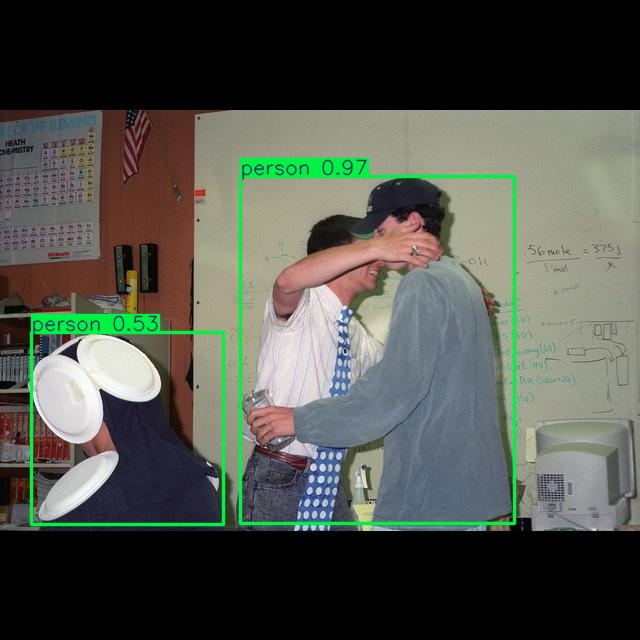

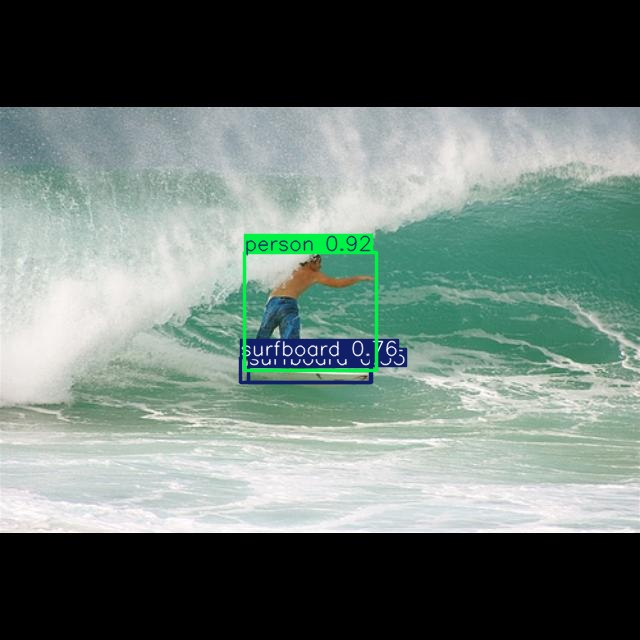

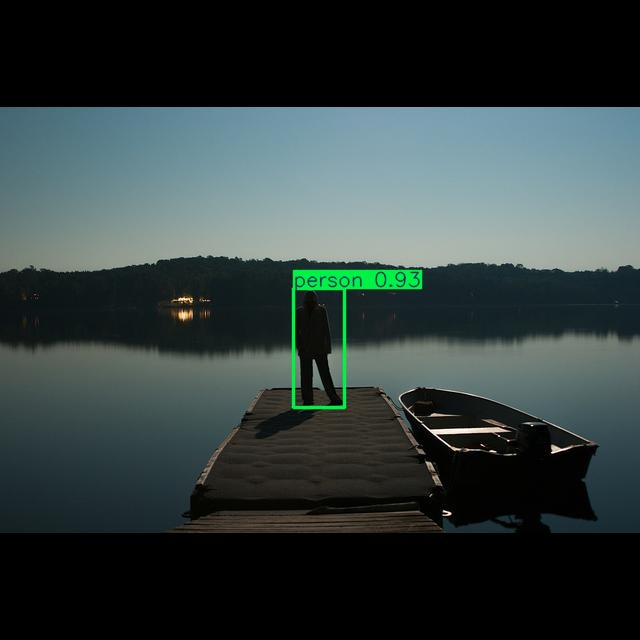

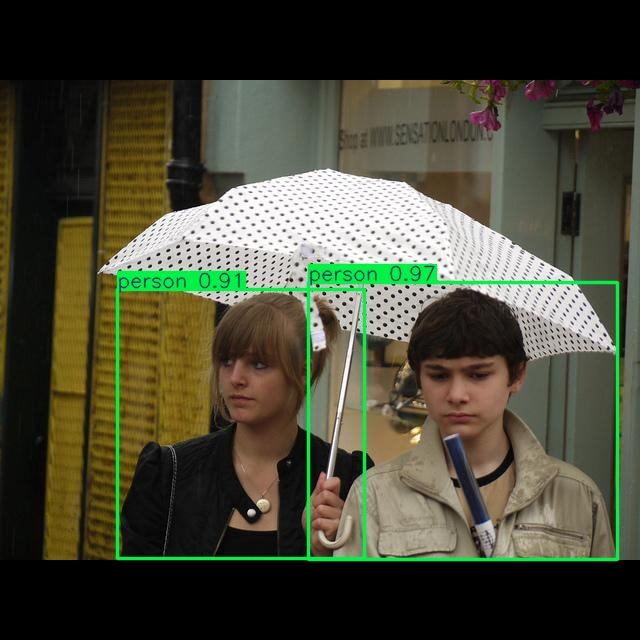

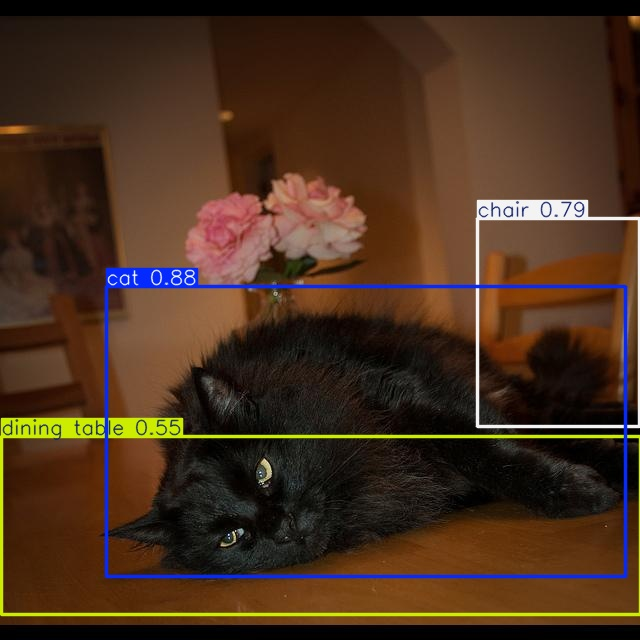

...

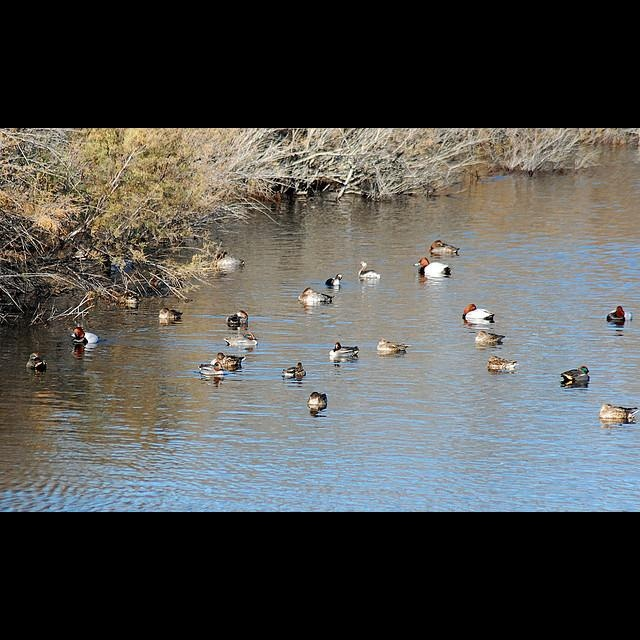

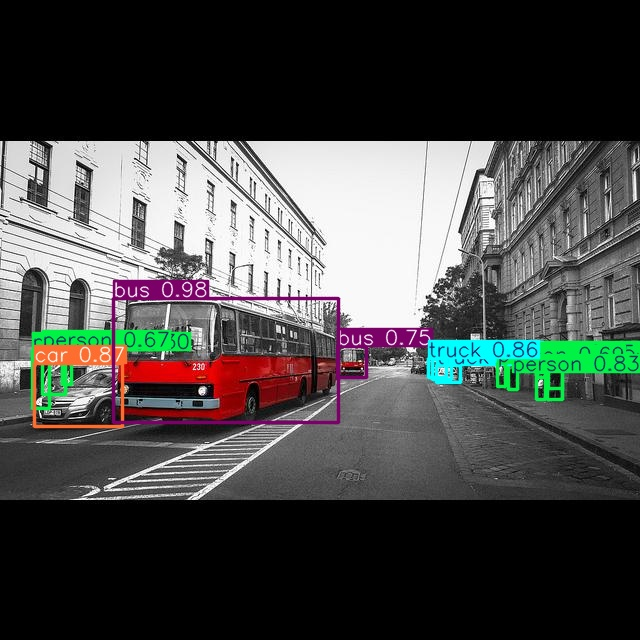

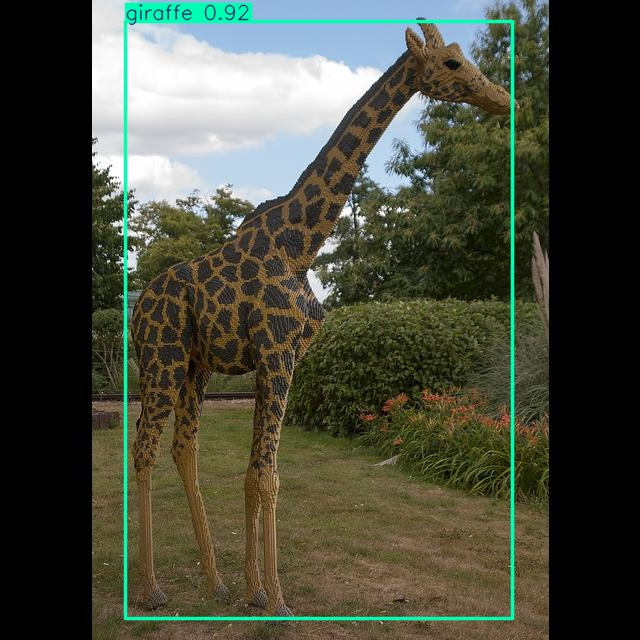

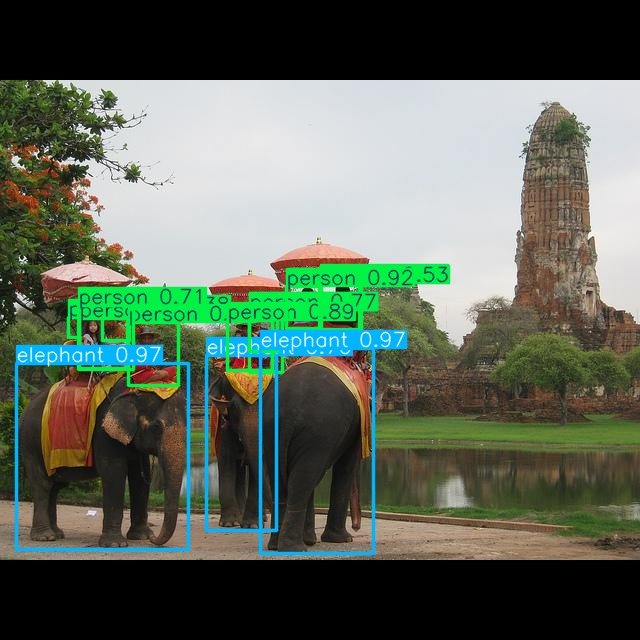

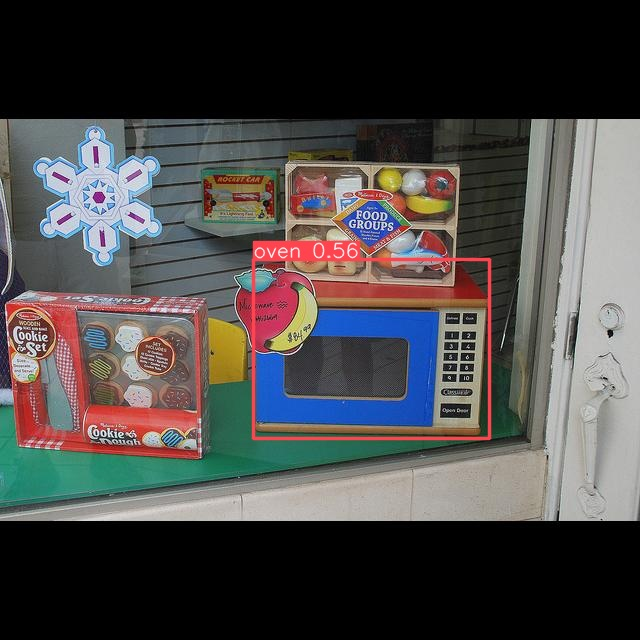

In [12]:
# Display predicted images with bounding boxes
from IPython.display import display
from PIL import Image

pred_dir = "/content/runs/detect/predict/"
for img in os.listdir(pred_dir):
    display(Image.open(os.path.join(pred_dir, img)))

**Declaration**

I, Sanika Kundekar, confirm that the work submitted in this assignment is my own and has been completed following academic integrity guidelines. The code is uploaded on my GitHub repository account, and the repository link is provided below:

GitHub Repository Link: [Insert GitHub Link]

Signature: Sanika Kundekar

**Submission Checklist**

✔ Ultralitycs Platform Documentsation Like hel file for Given Task

✔ Code file (Python Notebook or Script)

✔ Dataset or link to the dataset

✔ Visualizations (if applicable)

✔ Screenshots of model performance metrics

✔ Readme File

✔ Evaluation Metrics Details and discussion